In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pandas import DataFrame
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

In [2]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def relu(x):
    return np.maximum(0, x)

def sigmoid_derivat(dA, x):
    """
    sigmoid'(x) = x' * sigmoid(x) * (1 - sigmoid(x))
    """
    f = sigmoid(x)
    
    return dA * f * (1 - f)

def relu_derivat(dA, x):
    """ relu'(x) = [0, daca x <=0 altfel 1] * x' """
    dX = np.array(dA, copy=True)
    dX[x <= 0] = 0
    
    return dX

In [3]:
def bce(y, y_hat):
    n = y.shape[1]
    
    loss = (-1 / n) * (np.dot(y, np.log(y_hat).T) + np.dot(1 - y, np.log(1 - y_hat).T))
    
    return np.squeeze(loss)

def accuracy_score(y, y_hat):
    classes = (y_hat >= 0.5).astype(int)

    return (classes == y).mean()

In [4]:
X, y = make_moons(n_samples = 1000, noise=0.2, random_state=100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [5]:
X.shape

(1000, 2)

In [6]:
y.shape

(1000,)

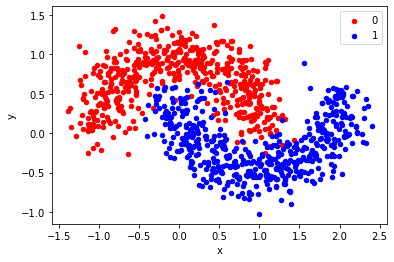

In [7]:
# scatter plot, dots colored by class value
df = DataFrame(dict(x=X[:,0], y=X[:,1], label=y))
colors = {0:'red', 1:'blue'}
fig, ax = plt.subplots()
grouped = df.groupby('label')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key])
plt.show()

In [8]:
class MLP():
    """
    Varianta definire MLP cu specificare input si output pentru fiecare unitate.
    """
    def __init__(self, architecture, lamb, random_seed=42):
        np.random.seed(random_seed)
        
        self.lamb = lamb
        self.activation_functions = {
            'sigmoid': sigmoid,
            'relu': relu
        }
        
        self.derivatives = {
            'relu': relu_derivat,
            'sigmoid': sigmoid_derivat
        }
        
        
        number_of_layers = len(architecture)
        params_values = {}

        for idx, layer in enumerate(architecture):
            layer_idx = idx + 1
            
            layer_input_size = layer["input_dim"]
            
            layer_output_size = layer["units"]

            params_values['W' + str(layer_idx)] = np.random.randn(layer_output_size, layer_input_size) * 0.1
            
            params_values['b' + str(layer_idx)] = np.random.randn(layer_output_size, 1) * 0.1
            
            
        self.params = params_values
        self.architecture = architecture
        
    def summary(self):
        print("{:^15s} {:^15s} {:^15s} {:^15s} {:^15s} {:^15s} \n".format(
            "Input shape",
            "Output shape",
            "Weights shape",
            "Bias shape",
            "Activation",
            "Params"
        ))
        print("{:_<100s}".format(''))
        total_params = 0
        for idx, layer in enumerate(self.architecture):
            layer_idx = idx + 1
            in_shape = layer["input_dim"]
            out_shape = layer["units"]
            
            weights_shape = self.params['W' + str(layer_idx)].shape
            bias_shape = self.params['b' + str(layer_idx)].shape
            
            activation = layer["activation"]
            
            weights_params = 1
            for dim in weights_shape:
                weights_params *= dim
            
            bias_params = 1
            for dim in bias_shape:
                bias_params *= dim
            
            num_params = bias_params + weights_params
            total_params += num_params
            
            print("{:^15d} {:^15d} {:^15s} {:^15s} {:^15s} {:^15d} \n".format(
                in_shape,
                out_shape,
                str(weights_shape),
                str(bias_shape),
                activation,
                num_params
            ))
            print("-"*100)
            
        print("Total number of parameters: {}".format(total_params))

    def forward(self, w, b, x, activation='relu'):
        z = np.dot(w, x) + b
    
        return self.activation_functions[activation](z), z
        
    def predict(self, x):
        """ Functie cu care realizam predictii prin metoda propagarii inainte. """
        memory = {}
        current_activation = x

        for idx, layer in enumerate(self.architecture):
            layer_idx = idx + 1
            previous_activation = current_activation
            
            activation_function = layer["activation"]
            
            w = self.params["W" + str(layer_idx)]
            
            b = self.params["b" + str(layer_idx)]

            current_activation, z = self.forward(w, b, previous_activation, activation_function)

            memory["x" + str(idx)] = previous_activation
            memory["z" + str(layer_idx)] = z

        return current_activation, memory
    
    def backward(self, dA_curr, W_curr, b_curr, Z_curr, A_prev, activation="relu"):
        # number of examples
        m = A_prev.shape[1]

        # selection of activation function
        if activation is "relu":
            backward_activation_func = relu_derivat
        elif activation is "sigmoid":
            backward_activation_func = sigmoid_derivat
        else:
            raise Exception('Non-supported activation function')

        # calculation of the activation function derivative
        dZ_curr = backward_activation_func(dA_curr, Z_curr)

        # derivative of the matrix W
        dW_curr = np.dot(dZ_curr, A_prev.T) / m
        # derivative of the vector b
        db_curr = np.sum(dZ_curr, axis=1, keepdims=True) / m
        # derivative of the matrix A_prev
        dA_prev = np.dot(W_curr.T, dZ_curr)

        return dA_prev, dW_curr, db_curr
    
    def backward_propagation(self, Y_hat, Y, memory):
        grads_values = {}
    
        # number of examples
        m = Y.shape[1]
        # a hack ensuring the same shape of the prediction vector and labels vector
        Y = Y.reshape(Y_hat.shape)

        # initiation of gradient descent algorithm
        dA_prev = - (np.divide(Y, Y_hat) - np.divide(1 - Y, 1 - Y_hat));

        for layer_idx_prev, layer in reversed(list(enumerate(self.architecture))):
            # we number network layers from 1
            layer_idx_curr = layer_idx_prev + 1
            # extraction of the activation function for the current layer
            activ_function_curr = layer["activation"]

            dA_curr = dA_prev

            A_prev = memory["x" + str(layer_idx_prev)]
            Z_curr = memory["z" + str(layer_idx_curr)]

            W_curr = self.params["W" + str(layer_idx_curr)]
            b_curr = self.params["b" + str(layer_idx_curr)]

            dA_prev, dW_curr, db_curr = self.backward(
                dA_curr, W_curr, b_curr, Z_curr, A_prev, activ_function_curr)

            grads_values["dW" + str(layer_idx_curr)] = dW_curr
            grads_values["db" + str(layer_idx_curr)] = db_curr

        return grads_values
    
    def update(self, grads_values, learning_rate):
        for layer_idx, layer in enumerate(self.architecture, 1):
            l2_reg_w = (self.params["W" + str(layer_idx)] * self.lamb) / len(self.params["W" + str(layer_idx)])
            l2_reg_b = (self.params["b" + str(layer_idx)] * self.lamb) / len(self.params["b" + str(layer_idx)])
            self.params["W" + str(layer_idx)] -= (learning_rate * grads_values["dW" + str(layer_idx)] + l2_reg_w)
            self.params["b" + str(layer_idx)] -= (learning_rate * grads_values["db" + str(layer_idx)] + l2_reg_b)
            
    def train(self, X, Y, epochs, learning_rate):
        cost_history = []
        accuracy_history = []

        for i in range(epochs):
            Y_hat, mem = self.predict(X)
            cost = bce(Y, Y_hat)
            
            cost_history.append(cost)
            accuracy = accuracy_score(Y, Y_hat)
            accuracy_history.append(accuracy)

            grads_values = self.backward_propagation(Y_hat, Y, mem)
            
            self.update(grads_values, learning_rate)
            
            if(i % 50 == 0):
                print("Iteration: {:05} - cost: {:.5f} - accuracy: {:.5f}".format(i, cost, accuracy))

        return cost_history, accuracy_history

In [9]:
architecture = [
    {
        "input_dim": 2,
        "units": 100,
        "activation": "relu"
    },
    {
        "input_dim": 100,
        "units": 200,
        "activation": "relu"
    },
    {
        "input_dim": 200,
        "units": 200,
        "activation": "relu"
    },
    {
        "input_dim": 200,
        "units": 100,
        "activation": "relu"
    },
    {
        "input_dim": 100,
        "units": 1,
        "activation": "sigmoid"
    },
]

# Metoda clasica -> definim reteaua iterativ si incercam mai multe variante

In [12]:
nn = MLP(architecture, 0.2)

In [13]:
hist = nn.train(X_train.T, y_train.reshape(1, y_train.shape[0]), 200, 0.1)

Iteration: 00000 - cost: 0.70851 - accuracy: 0.25333
Iteration: 00050 - cost: 0.68825 - accuracy: 0.81222
Iteration: 00100 - cost: 0.68706 - accuracy: 0.82000
Iteration: 00150 - cost: 0.68659 - accuracy: 0.81667


In [14]:
pred = nn.predict(X_test.T)

In [15]:
accuracy_score(y_test, pred[0])

0.81

# Varianta optima

Definim un 'grid' de hiperparametrii prin care iteram pentru a testa mai multe arhitecturi.

In [86]:
import copy

In [143]:
def recursive_define(depth, max_layers, units_range, arch=None, units=None):
    curr_arch = copy.deepcopy(arch)
    if depth == max_layers:
        curr_arch.append({
            "input_dim": arch[-1]["units"],
            "units": units,
            "activation": "sigmoid"
        })
        return curr_arch
    elif depth == 0:
        archs = []
        
        for i in range(len(units_range)):
            arch = [{
                "input_dim": 2,
                "units": units_range[i],
                "activation": "relu"
            }]
            for units in units_range:
                rez = recursive_define(depth+1, max_layers, units_range, arch, units)
                archs += rez
            
        return archs
    else:
        curr_arch.append({
            "input_dim": arch[-1]["units"],
            "units": units,
            "activation": "relu"
        })
        
        archs = []
        if depth + 1 == max_layers:
            rez = recursive_define(
                depth=depth+1,
                max_layers=max_layers,
                units_range=units_range,
                arch=curr_arch,
                units=1
            )
            archs.append(rez)
        else:
            for unit in units_range:
                rez = recursive_define(
                    depth=depth+1,
                    max_layers=max_layers,
                    units_range=units_range,
                    arch=curr_arch,
                    units=unit
                )
                
                archs += rez
        
        return archs
        

def define_grid(layers_range, units_range):
    architectures = []
    
    for layers_num in layers_range:
        architectures += recursive_define(0, layers_num, units_range)
    return architectures        

In [144]:
archs = define_grid(
    layers_range=[3, 4, 5, 6],
    units_range=[20, 50, 100, 200]
)

In [145]:
len(archs)

5440

In [146]:
best_acc = 0
best_arch = []
best_reg = 0
for reg in [0.2, 0.1, 0.01, 2e-3, 1e-3, 1e-4]:
    for architecture in archs:
        nn = MLP(architecture, 0.2)
        hist = nn.train(X_train.T, y_train.reshape(1, y_train.shape[0]), 300, 0.1)
        
        pred = nn.predict(X_test.T)
        acc = accuracy_score(y_test, pred[0])
        if acc > best_acc:
            best_acc = acc
            best_arch = architecture
            best_reg = reg
print("Best model got an accuracy of {} with regularisation of {} and architecture:{}".format(
    best_acc,
    best_reg,
    best_arch)
)

Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.63333
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69856 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69258 - accuracy: 0.84444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50889
Iteration: 00150 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69149 - accuracy: 0.61556
Iteration: 00050 - cost: 0.69082 - accuracy: 0.71333
Iteration: 00100 - cost: 0.69153 - accuracy: 0.55333
Iteration: 00150 - cost: 0.69209 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69249 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69167 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70196 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69100 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69170 - accuracy: 0.55444
Iteration: 00100 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69273 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69094 - accuracy: 0.50889
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.55333
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68984 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69652 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69293 - accuracy: 0.58444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69938 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69261 - accuracy: 0.80000
Iteration: 00100 - cost: 0.69292 - accuracy: 0

Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68920 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69240 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69083 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68853 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69209 - accuracy: 0.52444
Iteration: 00100 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69142 - accuracy: 0.52222
Iteration: 00100 - cost: 0.69195 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69288 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69546 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69452 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70436 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69614 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69074 - accuracy: 0.83667
Iteration: 00100 - cost: 0.69147 - accuracy: 0.83444
Iteration: 00150 - cost: 0.69214 - accuracy: 0.78667
Iteration: 00200 - cost: 0.69259 - accuracy: 0.52000
Iteration: 00250 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70099 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68777 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68743 - accuracy: 0.83333
Iteration: 00150 - cost: 0.68761 - accuracy: 0

Iteration: 00100 - cost: 0.69057 - accuracy: 0.74667
Iteration: 00150 - cost: 0.69144 - accuracy: 0.63556
Iteration: 00200 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70951 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68545 - accuracy: 0.77222
Iteration: 00100 - cost: 0.68275 - accuracy: 0.79333
Iteration: 00150 - cost: 0.68166 - accuracy: 0.79444
Iteration: 00200 - cost: 0.68163 - accuracy: 0.79333
Iteration: 00250 - cost: 0.68232 - accuracy: 0.79556
Iteration: 00000 - cost: 0.68824 - accuracy: 0.53778
Iteration: 00050 - cost: 0.69237 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69046 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68886 - accuracy: 0.86444
Iteration: 00100 - cost: 0.68950 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70028 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70047 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69544 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69705 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70178 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69469 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70433 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69619 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69177 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69155 - accuracy: 0.49889
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69328 - accuracy: 0.47222
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69310 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69874 - accuracy: 0

Iteration: 00000 - cost: 0.70665 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69403 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71866 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69897 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69512 - accuracy: 0.19556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69810 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.80889
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69906 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69221 - accuracy: 0.63111
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70374 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.19222
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.49222
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.54778
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69110 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69597 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69273 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69265 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70044 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70982 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69276 - accuracy: 0.78111
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68774 - accuracy: 0.55111
Iteration: 00050 - cost: 0.68770 - accuracy: 0.81000
Iteration: 00100 - cost: 0.68699 - accuracy: 0.81000
Iteration: 00150 - cost: 0.68710 - accuracy: 0.80778
Iteration: 00200 - cost: 0.68793 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69075 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69969 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69860 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69130 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0

Iteration: 00000 - cost: 0.69989 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71065 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69217 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69078 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69115 - accuracy: 0.50667
Iteration: 00150 - cost: 0.69174 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69180 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70108 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69103 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68998 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.43667
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69192 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69113 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69213 - accuracy: 0.74333
Iteration: 00100 - cost: 0.69265 - accuracy: 0

Iteration: 00050 - cost: 0.68121 - accuracy: 0.85333
Iteration: 00100 - cost: 0.67337 - accuracy: 0.84333
Iteration: 00150 - cost: 0.65990 - accuracy: 0.84000
Iteration: 00200 - cost: 0.63180 - accuracy: 0.84444
Iteration: 00250 - cost: 0.55650 - accuracy: 0.84778
Iteration: 00000 - cost: 0.70730 - accuracy: 0.50444
Iteration: 00050 - cost: 0.63425 - accuracy: 0.85111
Iteration: 00100 - cost: 0.46054 - accuracy: 0.85889
Iteration: 00150 - cost: 0.33956 - accuracy: 0.87111
Iteration: 00200 - cost: 0.30604 - accuracy: 0.87778
Iteration: 00250 - cost: 0.29338 - accuracy: 0.88222
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69538 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69119 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69212 - accuracy: 0.61778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69110 - accuracy: 0.54111
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.67854 - accuracy: 0.84444
Iteration: 00150 - cost: 0.67125 - accuracy: 0.84333
Iteration: 00200 - cost: 0.65913 - accuracy: 0.84222
Iteration: 00250 - cost: 0.63548 - accuracy: 0.84333
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70216 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69878 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69224 - accuracy: 0.75889
Iteration: 00100 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69825 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0

Iteration: 00000 - cost: 0.69708 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69573 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69887 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70072 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69164 - accuracy: 0.80000
Iteration: 00100 - cost: 0.69258 - accuracy: 0.79222
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.52222
Iteration: 00050 - cost: 0.68625 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68536 - accuracy: 0.50444
Iteration: 00150 - cost: 0.68600 - accuracy: 0.50444
Iteration: 00200 - cost: 0.68752 - accuracy: 0.50444
Iteration: 00250 - cost: 0.68929 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69054 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68990 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69098 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69184 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69288 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69462 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69352 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69510 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69787 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70172 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70893 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0

Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69452 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70559 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70357 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69220 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69532 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70093 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69692 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69239 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.46556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69398 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70250 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69793 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69470 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69675 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69230 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69794 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70985 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69716 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70496 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70064 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70220 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69244 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69680 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49000
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70056 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69581 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69404 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69527 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69210 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69922 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69694 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69698 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69849 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70623 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69772 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69749 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69790 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69728 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69130 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70793 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69659 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69501 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71092 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68992 - accuracy: 0.77444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69306 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69732 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69500 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69203 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70912 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71636 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69971 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70821 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70594 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69517 - accuracy: 0.28556
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68965 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69587 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68961 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69926 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71387 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69468 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71097 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69949 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69792 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69485 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69279 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69225 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69260 - accuracy: 0.47000
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69479 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69126 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69189 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70420 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68687 - accuracy: 0.52889
Iteration: 00100 - cost: 0.68345 - accuracy: 0.71778
Iteration: 00150 - cost: 0.67899 - accuracy: 0.78000
Iteration: 00200 - cost: 0.67341 - accuracy: 0.81111
Iteration: 00250 - cost: 0.66354 - accuracy: 0.81333
Iteration: 00000 - cost: 0.69036 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.61222
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70071 - accuracy: 0.31111
Iteration: 00050 - cost: 0.69269 - accuracy: 0

Iteration: 00000 - cost: 0.69400 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69751 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69579 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69717 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69852 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71120 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70162 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69760 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69266 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69065 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69222 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69891 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69664 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69956 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70316 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69902 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69183 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.56556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69736 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69426 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69105 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0

Iteration: 00250 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68908 - accuracy: 0.73111
Iteration: 00050 - cost: 0.68662 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68418 - accuracy: 0.84444
Iteration: 00150 - cost: 0.68253 - accuracy: 0.84222
Iteration: 00200 - cost: 0.68137 - accuracy: 0.84000
Iteration: 00250 - cost: 0.68046 - accuracy: 0.83778
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69602 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69393 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70134 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69055 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68962 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0

Iteration: 00000 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69361 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69520 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69688 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70004 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69650 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69047 - accuracy: 0.54222
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69155 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69975 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69036 - accuracy: 0.58667
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69796 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70031 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69253 - accuracy: 0

Iteration: 00000 - cost: 0.69895 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69214 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69757 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69641 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69975 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.72889
Iteration: 00100 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68949 - accuracy: 0.83889
Iteration: 00100 - cost: 0.68991 - accuracy: 0.83222
Iteration: 00150 - cost: 0.69087 - accuracy: 0.79778
Iteration: 00200 - cost: 0.69181 - accuracy: 0.59333
Iteration: 00250 - cost: 0.69247 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69206 - accuracy: 0.53667
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70109 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69707 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70297 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.24111
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69300 - accuracy: 0.56778
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69480 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69542 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69218 - accuracy: 0.66556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69576 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69591 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69399 - accuracy: 0.32667
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69966 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69193 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68933 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69969 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69448 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69920 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69475 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69467 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69870 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69515 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69866 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70902 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68940 - accuracy: 0.81778
Iteration: 00100 - cost: 0.68985 - accuracy: 0.82111
Iteration: 00150 - cost: 0.69084 - accuracy: 0.83000
Iteration: 00200 - cost: 0.69183 - accuracy: 0.77889
Iteration: 00250 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69551 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69194 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69765 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69200 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69353 - accuracy: 0.56444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69439 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70184 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69235 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69881 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70225 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.59333
Iteration: 00050 - cost: 0.69298 - accuracy: 0

Iteration: 00000 - cost: 0.69631 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69191 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68605 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68369 - accuracy: 0.50778
Iteration: 00150 - cost: 0.68221 - accuracy: 0.60222
Iteration: 00200 - cost: 0.68174 - accuracy: 0.69889
Iteration: 00250 - cost: 0.68227 - accuracy: 0.72111
Iteration: 00000 - cost: 0.72439 - accuracy: 0.26222
Iteration: 00050 - cost: 0.65868 - accuracy: 0.82778
Iteration: 00100 - cost: 0.52603 - accuracy: 0.84889
Iteration: 00150 - cost: 0.34331 - accuracy: 0.87667
Iteration: 00200 - cost: 0.29310 - accuracy: 0.88444
Iteration: 00250 - cost: 0.27422 - accuracy: 0.88556
Iteration: 00000 - cost: 0.69340 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70112 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69945 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69860 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69779 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69220 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69633 - accuracy: 0.23000
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.51556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.35778
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69563 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69176 - accuracy: 0.78667
Iteration: 00100 - cost: 0.69274 - accuracy: 0.66333
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71930 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68966 - accuracy: 0.82333
Iteration: 00100 - cost: 0.69152 - accuracy: 0.83111
Iteration: 00150 - cost: 0.69262 - accuracy: 0.59000
Iteration: 00200 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69245 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69168 - accuracy: 0.74778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70130 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70658 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69718 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70934 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71704 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69180 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69245 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69233 - accuracy: 0.62667
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.33250 - accuracy: 0.87667
Iteration: 00150 - cost: 0.27851 - accuracy: 0.88889
Iteration: 00200 - cost: 0.26179 - accuracy: 0.90000
Iteration: 00250 - cost: 0.26890 - accuracy: 0.88778
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69925 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70477 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69263 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71154 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68961 - accuracy: 0.84556
Iteration: 00100 - cost: 0.69037 - accuracy: 0.80889
Iteration: 00150 - cost: 0.69147 - accuracy: 0.55333
Iteration: 00200 - cost: 0.69231 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70136 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0

Iteration: 00000 - cost: 0.69988 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69229 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68932 - accuracy: 0

Iteration: 00000 - cost: 0.69160 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69264 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68826 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69171 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0

Iteration: 00000 - cost: 0.70963 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69150 - accuracy: 0.85444
Iteration: 00100 - cost: 0.69198 - accuracy: 0.84000
Iteration: 00150 - cost: 0.69240 - accuracy: 0.67778
Iteration: 00200 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69654 - accuracy: 0.45889
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68624 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69159 - accuracy: 0.50778
Iteration: 00100 - cost: 0.69219 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69663 - accuracy: 0

Iteration: 00000 - cost: 0.69384 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69608 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0

Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70003 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70309 - accuracy: 0

Iteration: 00000 - cost: 0.69419 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69648 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69567 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69437 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.37556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69746 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71048 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69470 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69164 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.65889
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68654 - accuracy: 0.63667
Iteration: 00050 - cost: 0.69196 - accuracy: 0.82778
Iteration: 00100 - cost: 0.69250 - accuracy: 0.66778
Iteration: 00150 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.35222
Iteration: 00050 - cost: 0.69090 - accuracy: 0.78889
Iteration: 00100 - cost: 0.69149 - accuracy: 0.65444
Iteration: 00150 - cost: 0.69209 - accuracy: 0

Iteration: 00100 - cost: 0.69272 - accuracy: 0.50556
Iteration: 00150 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70286 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69164 - accuracy: 0.80667
Iteration: 00100 - cost: 0.69216 - accuracy: 0.79667
Iteration: 00150 - cost: 0.69256 - accuracy: 0.68111
Iteration: 00200 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68937 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69219 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69265 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69090 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0

Iteration: 00000 - cost: 0.67924 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68793 - accuracy: 0.61889
Iteration: 00100 - cost: 0.68810 - accuracy: 0.61111
Iteration: 00150 - cost: 0.68899 - accuracy: 0.56778
Iteration: 00200 - cost: 0.69010 - accuracy: 0.51444
Iteration: 00250 - cost: 0.69111 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68510 - accuracy: 0.84000
Iteration: 00100 - cost: 0.68328 - accuracy: 0.83000
Iteration: 00150 - cost: 0.68175 - accuracy: 0.82889
Iteration: 00200 - cost: 0.68072 - accuracy: 0.82778
Iteration: 00250 - cost: 0.68025 - accuracy: 0.82778
Iteration: 00000 - cost: 0.69009 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68607 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69615 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69165 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69644 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69242 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69207 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69404 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69571 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69156 - accuracy: 0.78778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68563 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69916 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69913 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69684 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69432 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70163 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71096 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69692 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69763 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69122 - accuracy: 0.80667
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70624 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70950 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68863 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69690 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69599 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69021 - accuracy: 0.79222
Iteration: 00100 - cost: 0.69091 - accuracy: 0.74444
Iteration: 00150 - cost: 0.69165 - accuracy: 0.53778
Iteration: 00200 - cost: 0.69228 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69468 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69334 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70521 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69257 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69274 - accuracy: 0

Iteration: 00000 - cost: 0.69577 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70004 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0

Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69776 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69584 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69353 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69721 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69776 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70043 - accuracy: 0.48889
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68390 - accuracy: 0.50444
Iteration: 00100 - cost: 0.67808 - accuracy: 0.67222
Iteration: 00150 - cost: 0.67114 - accuracy: 0.74111
Iteration: 00200 - cost: 0.66065 - accuracy: 0.78444
Iteration: 00250 - cost: 0.63899 - accuracy: 0.79556
Iteration: 00000 - cost: 0.70529 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68616 - accuracy: 0.67667
Iteration: 00100 - cost: 0.67959 - accuracy: 0.81000
Iteration: 00150 - cost: 0.66888 - accuracy: 0.83333
Iteration: 00200 - cost: 0.64874 - accuracy: 0.83111
Iteration: 00250 - cost: 0.59935 - accuracy: 0.82444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.50556
Iteration: 00050 - cost: 0.69274 - accuracy: 0

Iteration: 00000 - cost: 0.69276 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69910 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69634 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69502 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69707 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70836 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69648 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69943 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69734 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.28444
Iteration: 00050 - cost: 0.69309 - accuracy: 0

Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69542 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68898 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68628 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69231 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70264 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.29632 - accuracy: 0.88111
Iteration: 00250 - cost: 0.28288 - accuracy: 0.88444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69199 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69120 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69172 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69230 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68808 - accuracy: 0.81667
Iteration: 00100 - cost: 0.68847 - accuracy: 0.82889
Iteration: 00150 - cost: 0.68965 - accuracy: 0.83111
Iteration: 00200 - cost: 0.69093 - accuracy: 0.83667
Iteration: 00250 - cost: 0.69192 - accuracy: 0.73111
Iteration: 00000 - cost: 0.70089 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69200 - accuracy: 0.79333
Iteration: 00150 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69003 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70293 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69237 - accuracy: 0.58778
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69065 - accuracy: 0.56556
Iteration: 00100 - cost: 0.69127 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70625 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70010 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69469 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0

Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69374 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69269 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.67556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70091 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69726 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69661 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69668 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69407 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69695 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69115 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69433 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69374 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69569 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69665 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69526 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69269 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69330 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69835 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69754 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69848 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70081 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70049 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69388 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69680 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70849 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69664 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69486 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69971 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69566 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.49667
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69822 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69477 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69457 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69588 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70185 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69600 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69216 - accuracy: 0.83667
Iteration: 00100 - cost: 0.69281 - accuracy: 0.50667
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69186 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69024 - accuracy: 0.51222
Iteration: 00100 - cost: 0.69102 - accuracy: 0.57333
Iteration: 00150 - cost: 0.69203 - accuracy: 0.72667
Iteration: 00200 - cost: 0.69273 - accuracy: 0.82444
Iteration: 00250 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69522 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69585 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69622 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69639 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71579 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69549 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69927 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69581 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69179 - accuracy: 0.62667
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69760 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69562 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69404 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70040 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69491 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69877 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69236 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70238 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69552 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69959 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69248 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69602 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70586 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69876 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69206 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.43556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69176 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0

Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69731 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70851 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69229 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70095 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69670 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69971 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69132 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69575 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69403 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69903 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69267 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69884 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69567 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69847 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69937 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69207 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70085 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69237 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69059 - accuracy: 0.82667
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69200 - accuracy: 0.64556
Iteration: 00100 - cost: 0.69257 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71025 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68972 - accuracy: 0.58444
Iteration: 00100 - cost: 0.69016 - accuracy: 0.51111
Iteration: 00150 - cost: 0.69101 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69190 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69838 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69888 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0

Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69813 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69257 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69399 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.57000
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69787 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70230 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69483 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70246 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69531 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69946 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69192 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69467 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72289 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70185 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70159 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69212 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69168 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69102 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69289 - accuracy: 0

Iteration: 00000 - cost: 0.69611 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70449 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69773 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70745 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69686 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69627 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69629 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69550 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69106 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69070 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.66889
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69227 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70489 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70021 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69288 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69687 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69203 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69515 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69965 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69140 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69606 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69640 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69407 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0

Iteration: 00000 - cost: 0.69400 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69953 - accuracy: 0.35444
Iteration: 00050 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70048 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69282 - accuracy: 0.80889
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69998 - accuracy: 0.31778
Iteration: 00050 - cost: 0.69151 - accuracy: 0.55778
Iteration: 00100 - cost: 0.69193 - accuracy: 0.69889
Iteration: 00150 - cost: 0.69246 - accuracy: 0.82333
Iteration: 00200 - cost: 0.69283 - accuracy: 0.68556
Iteration: 00250 - cost: 0.69301 - accuracy: 0

Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70143 - accuracy: 0.36111
Iteration: 00050 - cost: 0.69062 - accuracy: 0.73667
Iteration: 00100 - cost: 0.69132 - accuracy: 0.65444
Iteration: 00150 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69266 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69247 - accuracy: 0.54111
Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69726 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69761 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.22667
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70321 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69195 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69594 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70602 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69600 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69909 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69901 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70018 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69193 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69502 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70515 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69825 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.61000
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70809 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69834 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70485 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71575 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0

Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70216 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70525 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69512 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.68838 - accuracy: 0.83111
Iteration: 00150 - cost: 0.68939 - accuracy: 0.83222
Iteration: 00200 - cost: 0.69072 - accuracy: 0.84000
Iteration: 00250 - cost: 0.69183 - accuracy: 0.84556
Iteration: 00000 - cost: 0.69708 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68852 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69136 - accuracy: 0.84889
Iteration: 00100 - cost: 0.69228 - accuracy: 0.84444
Iteration: 00150 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68812 - accuracy: 0.85333
Iteration: 00100 - cost: 0.68836 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69587 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69234 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70700 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69658 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69112 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.83222
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69215 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69140 - accuracy: 0.81556
Iteration: 00100 - cost: 0.69210 - accuracy: 0.82000
Iteration: 00150 - cost: 0.69264 - accuracy: 0.81778
Iteration: 00200 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68632 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68477 - accuracy: 0.83889
Iteration: 00100 - cost: 0.68254 - accuracy: 0.83889
Iteration: 00150 - cost: 0.68121 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70006 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69475 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69016 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70820 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69293 - accuracy: 0

Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69594 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69235 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69836 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69288 - accuracy: 0.84667
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67552 - accuracy: 0.69667
Iteration: 00050 - cost: 0.63868 - accuracy: 0.86222
Iteration: 00100 - cost: 0.47571 - accuracy: 0.86222
Iteration: 00150 - cost: 0.31977 - accuracy: 0.88000
Iteration: 00200 - cost: 0.27986 - accuracy: 0.88778
Iteration: 00250 - cost: 0.26939 - accuracy: 0.89444
Iteration: 00000 - cost: 0.68998 - accuracy: 0.49556
Iteration: 00050 - cost: 0.55877 - accuracy: 0.85667
Iteration: 00100 - cost: 0.32360 - accuracy: 0.88000
Iteration: 00150 - cost: 0.26972 - accuracy: 0.88889
Iteration: 00200 - cost: 0.25193 - accuracy: 0.89778
Iteration: 00250 - cost: 0.24188 - accuracy: 0.90667
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69741 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69106 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.20778
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69894 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68971 - accuracy: 0.75111
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69916 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0

Iteration: 00250 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67824 - accuracy: 0.50444
Iteration: 00050 - cost: 0.66725 - accuracy: 0.82444
Iteration: 00100 - cost: 0.60709 - accuracy: 0.83000
Iteration: 00150 - cost: 0.44923 - accuracy: 0.85111
Iteration: 00200 - cost: 0.33370 - accuracy: 0.87444
Iteration: 00250 - cost: 0.29665 - accuracy: 0.88111
Iteration: 00000 - cost: 0.69309 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69170 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69641 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69270 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68983 - accuracy: 0.81111
Iteration: 00050 - cost: 0.69165 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69230 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69300 - accuracy: 0

Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70002 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68987 - accuracy: 0.63556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68732 - accuracy: 0.70889
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69813 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69251 - accuracy: 0.51889
Iteration: 00100 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70879 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69050 - accuracy: 0.82444
Iteration: 00100 - cost: 0.69196 - accuracy: 0

Iteration: 00050 - cost: 0.69175 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69234 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71084 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68559 - accuracy: 0.73444
Iteration: 00100 - cost: 0.68488 - accuracy: 0.77778
Iteration: 00150 - cost: 0.68616 - accuracy: 0.77444
Iteration: 00200 - cost: 0.68827 - accuracy: 0.71444
Iteration: 00250 - cost: 0.69031 - accuracy: 0.53111
Iteration: 00000 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69823 - accuracy: 0.31000
Iteration: 00050 - cost: 0.69215 - accuracy: 0

Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.63333
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69856 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69258 - accuracy: 0.84444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50889
Iteration: 00150 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69149 - accuracy: 0.61556
Iteration: 00050 - cost: 0.69082 - accuracy: 0.71333
Iteration: 00100 - cost: 0.69153 - accuracy: 0.55333
Iteration: 00150 - cost: 0.69209 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69249 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69167 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70196 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69100 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69170 - accuracy: 0.55444
Iteration: 00100 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69273 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69094 - accuracy: 0.50889
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.55333
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68984 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69652 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69293 - accuracy: 0.58444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69938 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69261 - accuracy: 0.80000
Iteration: 00100 - cost: 0.69292 - accuracy: 0

Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68920 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69240 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69083 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68853 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69209 - accuracy: 0.52444
Iteration: 00100 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69142 - accuracy: 0.52222
Iteration: 00100 - cost: 0.69195 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69288 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69546 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69452 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70436 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69614 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69074 - accuracy: 0.83667
Iteration: 00100 - cost: 0.69147 - accuracy: 0.83444
Iteration: 00150 - cost: 0.69214 - accuracy: 0.78667
Iteration: 00200 - cost: 0.69259 - accuracy: 0.52000
Iteration: 00250 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70099 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68777 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68743 - accuracy: 0.83333
Iteration: 00150 - cost: 0.68761 - accuracy: 0

Iteration: 00100 - cost: 0.69057 - accuracy: 0.74667
Iteration: 00150 - cost: 0.69144 - accuracy: 0.63556
Iteration: 00200 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70951 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68545 - accuracy: 0.77222
Iteration: 00100 - cost: 0.68275 - accuracy: 0.79333
Iteration: 00150 - cost: 0.68166 - accuracy: 0.79444
Iteration: 00200 - cost: 0.68163 - accuracy: 0.79333
Iteration: 00250 - cost: 0.68232 - accuracy: 0.79556
Iteration: 00000 - cost: 0.68824 - accuracy: 0.53778
Iteration: 00050 - cost: 0.69237 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69046 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68886 - accuracy: 0.86444
Iteration: 00100 - cost: 0.68950 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70028 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69544 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69705 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70178 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69469 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70433 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69619 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69177 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69155 - accuracy: 0.49889
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69328 - accuracy: 0.47222
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69310 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69874 - accuracy: 0

Iteration: 00000 - cost: 0.70665 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69403 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71866 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69897 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69512 - accuracy: 0.19556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69810 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.80889
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69906 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69221 - accuracy: 0.63111
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70374 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.19222
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.49222
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.54778
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69110 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69597 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69273 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69265 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70044 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70982 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69276 - accuracy: 0.78111
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68774 - accuracy: 0.55111
Iteration: 00050 - cost: 0.68770 - accuracy: 0.81000
Iteration: 00100 - cost: 0.68699 - accuracy: 0.81000
Iteration: 00150 - cost: 0.68710 - accuracy: 0.80778
Iteration: 00200 - cost: 0.68793 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69075 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69969 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69860 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69130 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0

Iteration: 00000 - cost: 0.69989 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71065 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69217 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69078 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69115 - accuracy: 0.50667
Iteration: 00150 - cost: 0.69174 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69180 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70108 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69103 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68998 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.43667
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69192 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69113 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69213 - accuracy: 0.74333
Iteration: 00100 - cost: 0.69265 - accuracy: 0

Iteration: 00050 - cost: 0.68121 - accuracy: 0.85333
Iteration: 00100 - cost: 0.67337 - accuracy: 0.84333
Iteration: 00150 - cost: 0.65990 - accuracy: 0.84000
Iteration: 00200 - cost: 0.63180 - accuracy: 0.84444
Iteration: 00250 - cost: 0.55650 - accuracy: 0.84778
Iteration: 00000 - cost: 0.70730 - accuracy: 0.50444
Iteration: 00050 - cost: 0.63425 - accuracy: 0.85111
Iteration: 00100 - cost: 0.46054 - accuracy: 0.85889
Iteration: 00150 - cost: 0.33956 - accuracy: 0.87111
Iteration: 00200 - cost: 0.30604 - accuracy: 0.87778
Iteration: 00250 - cost: 0.29338 - accuracy: 0.88222
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69538 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69119 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69212 - accuracy: 0.61778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69110 - accuracy: 0.54111
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.67854 - accuracy: 0.84444
Iteration: 00150 - cost: 0.67125 - accuracy: 0.84333
Iteration: 00200 - cost: 0.65913 - accuracy: 0.84222
Iteration: 00250 - cost: 0.63548 - accuracy: 0.84333
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70216 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69878 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69224 - accuracy: 0.75889
Iteration: 00100 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69825 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0

Iteration: 00000 - cost: 0.69708 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69573 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69887 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70072 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69164 - accuracy: 0.80000
Iteration: 00100 - cost: 0.69258 - accuracy: 0.79222
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.52222
Iteration: 00050 - cost: 0.68625 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68536 - accuracy: 0.50444
Iteration: 00150 - cost: 0.68600 - accuracy: 0.50444
Iteration: 00200 - cost: 0.68752 - accuracy: 0.50444
Iteration: 00250 - cost: 0.68929 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69054 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68990 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69098 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69184 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69288 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69462 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69352 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69510 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69787 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70172 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70893 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0

Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69452 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70559 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70357 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69220 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69532 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70093 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69692 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69239 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.46556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69398 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70250 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69793 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69470 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69675 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69230 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69794 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69353 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70985 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69716 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70496 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70064 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69244 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69680 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49000
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70056 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69581 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69527 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69468 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69210 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69922 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69694 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69698 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69849 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70623 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69772 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69749 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69790 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69728 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69130 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70793 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69659 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69501 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71092 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68992 - accuracy: 0.77444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69306 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69732 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69500 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69203 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70912 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71636 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69971 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70821 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70594 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69517 - accuracy: 0.28556
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68965 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69587 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68961 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69926 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71387 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69468 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71097 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69949 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69792 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69485 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69279 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69225 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69260 - accuracy: 0.47000
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69479 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69126 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69189 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70420 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68687 - accuracy: 0.52889
Iteration: 00100 - cost: 0.68345 - accuracy: 0.71778
Iteration: 00150 - cost: 0.67899 - accuracy: 0.78000
Iteration: 00200 - cost: 0.67341 - accuracy: 0.81111
Iteration: 00250 - cost: 0.66354 - accuracy: 0.81333
Iteration: 00000 - cost: 0.69036 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.61222
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70071 - accuracy: 0.31111
Iteration: 00050 - cost: 0.69269 - accuracy: 0

Iteration: 00000 - cost: 0.69400 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69751 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69579 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69717 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69852 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71120 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70162 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69760 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69266 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69065 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69222 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69891 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69664 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69956 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70316 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69902 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69183 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.56556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69736 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69426 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69105 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0

Iteration: 00250 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68908 - accuracy: 0.73111
Iteration: 00050 - cost: 0.68662 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68418 - accuracy: 0.84444
Iteration: 00150 - cost: 0.68253 - accuracy: 0.84222
Iteration: 00200 - cost: 0.68137 - accuracy: 0.84000
Iteration: 00250 - cost: 0.68046 - accuracy: 0.83778
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69602 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69393 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70134 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69055 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68962 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0

Iteration: 00000 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69361 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69520 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69688 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70004 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69650 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69047 - accuracy: 0.54222
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69155 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69975 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69036 - accuracy: 0.58667
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69796 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70031 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69253 - accuracy: 0

Iteration: 00000 - cost: 0.69895 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69214 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69757 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69641 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69975 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.72889
Iteration: 00100 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68949 - accuracy: 0.83889
Iteration: 00100 - cost: 0.68991 - accuracy: 0.83222
Iteration: 00150 - cost: 0.69087 - accuracy: 0.79778
Iteration: 00200 - cost: 0.69181 - accuracy: 0.59333
Iteration: 00250 - cost: 0.69247 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69206 - accuracy: 0.53667
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70109 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69707 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70297 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.24111
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69300 - accuracy: 0.56778
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69480 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69542 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69218 - accuracy: 0.66556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69576 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69591 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69399 - accuracy: 0.32667
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69966 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69193 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68933 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69969 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69448 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69920 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69475 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69467 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69870 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69515 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69866 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70902 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68940 - accuracy: 0.81778
Iteration: 00100 - cost: 0.68985 - accuracy: 0.82111
Iteration: 00150 - cost: 0.69084 - accuracy: 0.83000
Iteration: 00200 - cost: 0.69183 - accuracy: 0.77889
Iteration: 00250 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69551 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69194 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69765 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69200 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69353 - accuracy: 0.56444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69439 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70184 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69235 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69881 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70225 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.59333
Iteration: 00050 - cost: 0.69298 - accuracy: 0

Iteration: 00000 - cost: 0.69631 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69191 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68605 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68369 - accuracy: 0.50778
Iteration: 00150 - cost: 0.68221 - accuracy: 0.60222
Iteration: 00200 - cost: 0.68174 - accuracy: 0.69889
Iteration: 00250 - cost: 0.68227 - accuracy: 0.72111
Iteration: 00000 - cost: 0.72439 - accuracy: 0.26222
Iteration: 00050 - cost: 0.65868 - accuracy: 0.82778
Iteration: 00100 - cost: 0.52603 - accuracy: 0.84889
Iteration: 00150 - cost: 0.34331 - accuracy: 0.87667
Iteration: 00200 - cost: 0.29310 - accuracy: 0.88444
Iteration: 00250 - cost: 0.27422 - accuracy: 0.88556
Iteration: 00000 - cost: 0.69340 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70112 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69945 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69860 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69779 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69220 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69633 - accuracy: 0.23000
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.51556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.35778
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69563 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69176 - accuracy: 0.78667
Iteration: 00100 - cost: 0.69274 - accuracy: 0.66333
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71930 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68966 - accuracy: 0.82333
Iteration: 00100 - cost: 0.69152 - accuracy: 0.83111
Iteration: 00150 - cost: 0.69262 - accuracy: 0.59000
Iteration: 00200 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69245 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69168 - accuracy: 0.74778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70130 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70658 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69718 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70934 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71704 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69180 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69245 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69233 - accuracy: 0.62667
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.33250 - accuracy: 0.87667
Iteration: 00150 - cost: 0.27851 - accuracy: 0.88889
Iteration: 00200 - cost: 0.26179 - accuracy: 0.90000
Iteration: 00250 - cost: 0.26890 - accuracy: 0.88778
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69925 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70477 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69263 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71154 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68961 - accuracy: 0.84556
Iteration: 00100 - cost: 0.69037 - accuracy: 0.80889
Iteration: 00150 - cost: 0.69147 - accuracy: 0.55333
Iteration: 00200 - cost: 0.69231 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70136 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0

Iteration: 00000 - cost: 0.69988 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69229 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68932 - accuracy: 0

Iteration: 00000 - cost: 0.69160 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69264 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68826 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69171 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0

Iteration: 00000 - cost: 0.70963 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69150 - accuracy: 0.85444
Iteration: 00100 - cost: 0.69198 - accuracy: 0.84000
Iteration: 00150 - cost: 0.69240 - accuracy: 0.67778
Iteration: 00200 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69654 - accuracy: 0.45889
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68624 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69159 - accuracy: 0.50778
Iteration: 00100 - cost: 0.69219 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69663 - accuracy: 0

Iteration: 00000 - cost: 0.69384 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69608 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0

Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70003 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70309 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69567 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69437 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.37556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69746 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71048 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69470 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69164 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.65889
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68654 - accuracy: 0.63667
Iteration: 00050 - cost: 0.69196 - accuracy: 0.82778
Iteration: 00100 - cost: 0.69250 - accuracy: 0.66778
Iteration: 00150 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.35222
Iteration: 00050 - cost: 0.69090 - accuracy: 0

Iteration: 00000 - cost: 0.69216 - accuracy: 0.56889
Iteration: 00050 - cost: 0.69232 - accuracy: 0.79667
Iteration: 00100 - cost: 0.69272 - accuracy: 0.50556
Iteration: 00150 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70286 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69164 - accuracy: 0.80667
Iteration: 00100 - cost: 0.69216 - accuracy: 0.79667
Iteration: 00150 - cost: 0.69256 - accuracy: 0.68111
Iteration: 00200 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68937 - accuracy: 0

Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67924 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68793 - accuracy: 0.61889
Iteration: 00100 - cost: 0.68810 - accuracy: 0.61111
Iteration: 00150 - cost: 0.68899 - accuracy: 0.56778
Iteration: 00200 - cost: 0.69010 - accuracy: 0.51444
Iteration: 00250 - cost: 0.69111 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68510 - accuracy: 0.84000
Iteration: 00100 - cost: 0.68328 - accuracy: 0.83000
Iteration: 00150 - cost: 0.68175 - accuracy: 0.82889
Iteration: 00200 - cost: 0.68072 - accuracy: 0.82778
Iteration: 00250 - cost: 0.68025 - accuracy: 0.82778
Iteration: 00000 - cost: 0.69009 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69615 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69165 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69644 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69617 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69678 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69207 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69404 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69571 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69156 - accuracy: 0.78778
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68563 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69916 - accuracy: 0

Iteration: 00000 - cost: 0.69338 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69913 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69684 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70163 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71096 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69692 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69763 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69122 - accuracy: 0.80667
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70624 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70950 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68863 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69690 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69599 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69021 - accuracy: 0.79222
Iteration: 00100 - cost: 0.69091 - accuracy: 0.74444
Iteration: 00150 - cost: 0.69165 - accuracy: 0.53778
Iteration: 00200 - cost: 0.69228 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69468 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69334 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70521 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69257 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69274 - accuracy: 0

Iteration: 00000 - cost: 0.69577 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70004 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0

Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69776 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69584 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69353 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69721 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69776 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70043 - accuracy: 0.48889
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68390 - accuracy: 0.50444
Iteration: 00100 - cost: 0.67808 - accuracy: 0.67222
Iteration: 00150 - cost: 0.67114 - accuracy: 0.74111
Iteration: 00200 - cost: 0.66065 - accuracy: 0.78444
Iteration: 00250 - cost: 0.63899 - accuracy: 0.79556
Iteration: 00000 - cost: 0.70529 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68616 - accuracy: 0.67667
Iteration: 00100 - cost: 0.67959 - accuracy: 0.81000
Iteration: 00150 - cost: 0.66888 - accuracy: 0.83333
Iteration: 00200 - cost: 0.64874 - accuracy: 0.83111
Iteration: 00250 - cost: 0.59935 - accuracy: 0.82444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.50556
Iteration: 00050 - cost: 0.69274 - accuracy: 0

Iteration: 00000 - cost: 0.69276 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69910 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69634 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69502 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69707 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70836 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69648 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69943 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69734 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.28444
Iteration: 00050 - cost: 0.69309 - accuracy: 0

Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69542 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68898 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68628 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69231 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70264 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.29632 - accuracy: 0.88111
Iteration: 00250 - cost: 0.28288 - accuracy: 0.88444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69199 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69120 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69172 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69230 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68808 - accuracy: 0.81667
Iteration: 00100 - cost: 0.68847 - accuracy: 0.82889
Iteration: 00150 - cost: 0.68965 - accuracy: 0.83111
Iteration: 00200 - cost: 0.69093 - accuracy: 0.83667
Iteration: 00250 - cost: 0.69192 - accuracy: 0.73111
Iteration: 00000 - cost: 0.70089 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69200 - accuracy: 0.79333
Iteration: 00150 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69003 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70293 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69237 - accuracy: 0.58778
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69065 - accuracy: 0.56556
Iteration: 00100 - cost: 0.69127 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70625 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69469 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69374 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69269 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.67556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70091 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69726 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69661 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69668 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69407 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69695 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69115 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69433 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69374 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69569 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69665 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69526 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69269 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69835 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69754 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69848 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70081 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.46889
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70849 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69664 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69486 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69566 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.49667
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69716 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69954 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69466 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69645 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69822 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69477 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69588 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70185 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69495 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69600 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69216 - accuracy: 0.83667
Iteration: 00100 - cost: 0.69281 - accuracy: 0.50667
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69186 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69024 - accuracy: 0.51222
Iteration: 00100 - cost: 0.69102 - accuracy: 0.57333
Iteration: 00150 - cost: 0.69203 - accuracy: 0.72667
Iteration: 00200 - cost: 0.69273 - accuracy: 0.82444
Iteration: 00250 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69585 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69622 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69639 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69545 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69549 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69675 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69424 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69927 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69581 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69179 - accuracy: 0.62667
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69760 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69562 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69404 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.53556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0

Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70040 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69491 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69877 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69417 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69236 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70238 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70027 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69552 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69959 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69465 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69248 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69602 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70586 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69206 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69650 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.43556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69367 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69176 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69731 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69229 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.85111
Iteration: 00100 - cost: 0.69302 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69670 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69532 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69971 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69132 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69575 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69403 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69267 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69884 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69567 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69864 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69847 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69937 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69207 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70085 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70685 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69237 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69059 - accuracy: 0.82667
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69200 - accuracy: 0.64556
Iteration: 00100 - cost: 0.69257 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71025 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68972 - accuracy: 0.58444
Iteration: 00100 - cost: 0.69016 - accuracy: 0.51111
Iteration: 00150 - cost: 0.69101 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69190 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69838 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69257 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69314 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69399 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.57000
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69787 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70230 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70246 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69240 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69904 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69531 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69946 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69467 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.72289 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70185 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70159 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69212 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69168 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69102 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70449 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70745 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69426 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69466 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69686 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69666 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69627 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69550 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69297 - accuracy: 0

Iteration: 00000 - cost: 0.69590 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69106 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69070 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.66889
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69227 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70489 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70021 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69687 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69515 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69474 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68951 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69965 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69140 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69606 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69640 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69264 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69407 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70048 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69282 - accuracy: 0.80889
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69998 - accuracy: 0.31778
Iteration: 00050 - cost: 0.69151 - accuracy: 0.55778
Iteration: 00100 - cost: 0.69193 - accuracy: 0.69889
Iteration: 00150 - cost: 0.69246 - accuracy: 0.82333
Iteration: 00200 - cost: 0.69283 - accuracy: 0.68556
Iteration: 00250 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69285 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.70143 - accuracy: 0.36111
Iteration: 00050 - cost: 0.69062 - accuracy: 0.73667
Iteration: 00100 - cost: 0.69132 - accuracy: 0.65444
Iteration: 00150 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69266 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69247 - accuracy: 0.54111
Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69726 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69761 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.22667
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69195 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69594 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70602 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69632 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0

Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69600 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69320 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69909 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69901 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70018 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69502 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70515 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.29889
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69825 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.61000
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69496 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70809 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69834 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70485 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71575 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70525 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69227 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69512 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70073 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69072 - accuracy: 0.84000
Iteration: 00250 - cost: 0.69183 - accuracy: 0.84556
Iteration: 00000 - cost: 0.69708 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68852 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69136 - accuracy: 0.84889
Iteration: 00100 - cost: 0.69228 - accuracy: 0.84444
Iteration: 00150 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68812 - accuracy: 0.85333
Iteration: 00100 - cost: 0.68836 - accuracy: 0.85222
Iteration: 00150 - cost: 0.68951 - accuracy: 0.84778
Iteration: 00200 - cost: 0.69091 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69587 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69234 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70700 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69658 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69762 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69112 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.83222
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69215 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69140 - accuracy: 0.81556
Iteration: 00100 - cost: 0.69210 - accuracy: 0.82000
Iteration: 00150 - cost: 0.69264 - accuracy: 0.81778
Iteration: 00200 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68632 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68477 - accuracy: 0.83889
Iteration: 00100 - cost: 0.68254 - accuracy: 0.83889
Iteration: 00150 - cost: 0.68121 - accuracy: 0.84000
Iteration: 00200 - cost: 0.68075 - accuracy: 0.84000
Iteration: 00250 - cost: 0.68115 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70006 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69475 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69016 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70820 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69235 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69836 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69288 - accuracy: 0.84667
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69803 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69237 - accuracy: 0

Iteration: 00000 - cost: 0.67552 - accuracy: 0.69667
Iteration: 00050 - cost: 0.63868 - accuracy: 0.86222
Iteration: 00100 - cost: 0.47571 - accuracy: 0.86222
Iteration: 00150 - cost: 0.31977 - accuracy: 0.88000
Iteration: 00200 - cost: 0.27986 - accuracy: 0.88778
Iteration: 00250 - cost: 0.26939 - accuracy: 0.89444
Iteration: 00000 - cost: 0.68998 - accuracy: 0.49556
Iteration: 00050 - cost: 0.55877 - accuracy: 0.85667
Iteration: 00100 - cost: 0.32360 - accuracy: 0.88000
Iteration: 00150 - cost: 0.26972 - accuracy: 0.88889
Iteration: 00200 - cost: 0.25193 - accuracy: 0.89778
Iteration: 00250 - cost: 0.24188 - accuracy: 0.90667
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69741 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69106 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.20778
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68971 - accuracy: 0.75111
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69916 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.66725 - accuracy: 0.82444
Iteration: 00100 - cost: 0.60709 - accuracy: 0.83000
Iteration: 00150 - cost: 0.44923 - accuracy: 0.85111
Iteration: 00200 - cost: 0.33370 - accuracy: 0.87444
Iteration: 00250 - cost: 0.29665 - accuracy: 0.88111
Iteration: 00000 - cost: 0.69309 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69766 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69170 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69641 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69270 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68983 - accuracy: 0.81111
Iteration: 00050 - cost: 0.69165 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69230 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70002 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68987 - accuracy: 0.63556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68732 - accuracy: 0.70889
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69813 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69251 - accuracy: 0.51889
Iteration: 00100 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70879 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69050 - accuracy: 0.82444
Iteration: 00100 - cost: 0.69196 - accuracy: 0.61556
Iteration: 00150 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0

Iteration: 00150 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71084 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68559 - accuracy: 0.73444
Iteration: 00100 - cost: 0.68488 - accuracy: 0.77778
Iteration: 00150 - cost: 0.68616 - accuracy: 0.77444
Iteration: 00200 - cost: 0.68827 - accuracy: 0.71444
Iteration: 00250 - cost: 0.69031 - accuracy: 0.53111
Iteration: 00000 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69823 - accuracy: 0.31000
Iteration: 00050 - cost: 0.69215 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.63333
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69258 - accuracy: 0.84444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50889
Iteration: 00150 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69149 - accuracy: 0.61556
Iteration: 00050 - cost: 0.69082 - accuracy: 0.71333
Iteration: 00100 - cost: 0.69153 - accuracy: 0.55333
Iteration: 00150 - cost: 0.69209 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69249 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69336 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70170 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69256 - accuracy: 0

Iteration: 00000 - cost: 0.69167 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70196 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69100 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69170 - accuracy: 0.55444
Iteration: 00100 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71249 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69094 - accuracy: 0.50889
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.55333
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68984 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69652 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69293 - accuracy: 0.58444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69938 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69261 - accuracy: 0.80000
Iteration: 00100 - cost: 0.69292 - accuracy: 0

Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68920 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69240 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69083 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68853 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69209 - accuracy: 0.52444
Iteration: 00100 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69142 - accuracy: 0.52222
Iteration: 00100 - cost: 0.69195 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69239 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69288 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69546 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69452 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70436 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69614 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69074 - accuracy: 0.83667
Iteration: 00100 - cost: 0.69147 - accuracy: 0.83444
Iteration: 00150 - cost: 0.69214 - accuracy: 0.78667
Iteration: 00200 - cost: 0.69259 - accuracy: 0.52000
Iteration: 00250 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70099 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68777 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68743 - accuracy: 0.83333
Iteration: 00150 - cost: 0.68761 - accuracy: 0

Iteration: 00100 - cost: 0.69057 - accuracy: 0.74667
Iteration: 00150 - cost: 0.69144 - accuracy: 0.63556
Iteration: 00200 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70951 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68545 - accuracy: 0.77222
Iteration: 00100 - cost: 0.68275 - accuracy: 0.79333
Iteration: 00150 - cost: 0.68166 - accuracy: 0.79444
Iteration: 00200 - cost: 0.68163 - accuracy: 0.79333
Iteration: 00250 - cost: 0.68232 - accuracy: 0.79556
Iteration: 00000 - cost: 0.68824 - accuracy: 0.53778
Iteration: 00050 - cost: 0.69237 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69046 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68886 - accuracy: 0.86444
Iteration: 00100 - cost: 0.68950 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70028 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70047 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69544 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69705 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70178 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69469 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70433 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69619 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69177 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69416 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69155 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.47222
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69310 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70665 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69403 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71866 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69897 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69505 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69529 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69512 - accuracy: 0.19556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.68979 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69287 - accuracy: 0.51222
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69810 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.80889
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69906 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69221 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69738 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.19222
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69416 - accuracy: 0.49222
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69116 - accuracy: 0.54778
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69597 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69273 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69265 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69111 - accuracy: 0.50667
Iteration: 00100 - cost: 0.69163 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69215 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70044 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70982 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69276 - accuracy: 0.78111
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68774 - accuracy: 0.55111
Iteration: 00050 - cost: 0.68770 - accuracy: 0

Iteration: 00000 - cost: 0.69240 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69075 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69555 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69969 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69201 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69586 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69989 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71065 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69217 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69078 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69115 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69180 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70108 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0

Iteration: 00000 - cost: 0.69432 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69103 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68998 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.43667
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69192 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69055 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69113 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69178 - accuracy: 0.82000
Iteration: 00200 - cost: 0.69245 - accuracy: 0.81000
Iteration: 00250 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68125 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68121 - accuracy: 0.85333
Iteration: 00100 - cost: 0.67337 - accuracy: 0.84333
Iteration: 00150 - cost: 0.65990 - accuracy: 0.84000
Iteration: 00200 - cost: 0.63180 - accuracy: 0.84444
Iteration: 00250 - cost: 0.55650 - accuracy: 0.84778
Iteration: 00000 - cost: 0.70730 - accuracy: 0.50444
Iteration: 00050 - cost: 0.63425 - accuracy: 0.85111
Iteration: 00100 - cost: 0.46054 - accuracy: 0.85889
Iteration: 00150 - cost: 0.33956 - accuracy: 0.87111
Iteration: 00200 - cost: 0.30604 - accuracy: 0.87778
Iteration: 00250 - cost: 0.29338 - accuracy: 0.88222
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69538 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69279 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69212 - accuracy: 0.61778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69406 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69538 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69110 - accuracy: 0.54111
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69158 - accuracy: 0.82222
Iteration: 00250 - cost: 0.69231 - accuracy: 0.83000
Iteration: 00000 - cost: 0.70569 - accuracy: 0.47222
Iteration: 00050 - cost: 0.68408 - accuracy: 0.84778
Iteration: 00100 - cost: 0.67854 - accuracy: 0.84444
Iteration: 00150 - cost: 0.67125 - accuracy: 0.84333
Iteration: 00200 - cost: 0.65913 - accuracy: 0.84222
Iteration: 00250 - cost: 0.63548 - accuracy: 0.84333
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70216 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69878 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69224 - accuracy: 0.75889
Iteration: 00100 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69288 - accuracy: 0

Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69708 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69573 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69887 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69164 - accuracy: 0

Iteration: 00000 - cost: 0.69196 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69213 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.52222
Iteration: 00050 - cost: 0.68625 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68536 - accuracy: 0.50444
Iteration: 00150 - cost: 0.68600 - accuracy: 0.50444
Iteration: 00200 - cost: 0.68752 - accuracy: 0.50444
Iteration: 00250 - cost: 0.68929 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69054 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68990 - accuracy: 0

Iteration: 00250 - cost: 0.26858 - accuracy: 0.88667
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69604 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69787 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69398 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70172 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70893 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69396 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69320 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.56333
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70559 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69220 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69532 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70093 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69970 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69410 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69239 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69398 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70250 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69470 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69473 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69385 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69583 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70173 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69230 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70985 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70171 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69768 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70496 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70064 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70220 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69889 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69699 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69687 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69244 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69680 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70056 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69581 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69546 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69404 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69527 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69361 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69922 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69694 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69530 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69706 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69747 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69772 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69495 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69859 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69749 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69528 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69728 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69376 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70793 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69659 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69501 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69260 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69229 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69380 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69554 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68992 - accuracy: 0.77444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70767 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69306 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69732 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70133 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69711 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69606 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69352 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69538 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69515 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70912 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69942 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69392 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69197 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70001 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.28556
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68965 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0

Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69161 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68961 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69471 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71122 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69547 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69394 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69719 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69184 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71097 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69705 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69499 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69840 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69792 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69485 - accuracy: 0.49333
Iteration: 00050 - cost: 0.69279 - accuracy: 0

Iteration: 00000 - cost: 0.69529 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69260 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70225 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69181 - accuracy: 0.81111
Iteration: 00100 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69518 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69356 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69249 - accuracy: 0.79000
Iteration: 00100 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69126 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69189 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70420 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68687 - accuracy: 0.52889
Iteration: 00100 - cost: 0.68345 - accuracy: 0.71778
Iteration: 00150 - cost: 0.67899 - accuracy: 0.78000
Iteration: 00200 - cost: 0.67341 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.21889
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69500 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69423 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69358 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69494 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69378 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69349 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69545 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69410 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69723 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69834 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69760 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69636 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69550 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69891 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69429 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69252 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.47000
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69956 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69427 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70316 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69902 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69272 - accuracy: 0

Iteration: 00000 - cost: 0.69334 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70036 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69481 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69183 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69277 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69238 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69736 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69464 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69426 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69105 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69013 - accuracy: 0.81444
Iteration: 00100 - cost: 0.69105 - accuracy: 0.77556
Iteration: 00150 - cost: 0.69205 - accuracy: 0.54000
Iteration: 00200 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68908 - accuracy: 0.73111
Iteration: 00050 - cost: 0.68662 - accuracy: 0.83222
Iteration: 00100 - cost: 0.68418 - accuracy: 0.84444
Iteration: 00150 - cost: 0.68253 - accuracy: 0.84222
Iteration: 00200 - cost: 0.68137 - accuracy: 0.84000
Iteration: 00250 - cost: 0.68046 - accuracy: 0.83778
Iteration: 00000 - cost: 0.69317 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69285 - accuracy: 0.68333
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69602 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69707 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69733 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69609 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69055 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69012 - accuracy: 0.82222
Iteration: 00050 - cost: 0.69235 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69727 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71051 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69905 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.32695 - accuracy: 0.87667
Iteration: 00250 - cost: 0.29990 - accuracy: 0.88111
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69633 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69573 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70004 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69397 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69357 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69346 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69047 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69343 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69545 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69154 - accuracy: 0.54889
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69036 - accuracy: 0.58667
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70132 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69895 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70476 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69214 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0

Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69850 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69274 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69150 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69280 - accuracy: 0.50667
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69975 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.72889
Iteration: 00100 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68949 - accuracy: 0

Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69402 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70019 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70744 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69412 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.56778
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69440 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69480 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69542 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69504 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69533 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69506 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0.25556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.29444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69972 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69399 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69621 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69334 - accuracy: 0.40111
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69966 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69890 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69193 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69438 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69448 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69358 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69461 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70325 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69920 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69226 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69599 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69866 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69274 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69021 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69276 - accuracy: 0.67444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71083 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69234 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70902 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68940 - accuracy: 0.81778
Iteration: 00100 - cost: 0.68985 - accuracy: 0.82111
Iteration: 00150 - cost: 0.69084 - accuracy: 0.83000
Iteration: 00200 - cost: 0.69183 - accuracy: 0.77889
Iteration: 00250 - cost: 0.69252 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69337 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69522 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69551 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69568 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69553 - accuracy: 0.45222
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69765 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69234 - accuracy: 0.50778
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.70629 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71499 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69200 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69734 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69439 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71136 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69881 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69207 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69258 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69265 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69631 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69191 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69246 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69497 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68605 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68369 - accuracy: 0.50778
Iteration: 00150 - cost: 0.68221 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69193 - accuracy: 0.49000
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70112 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.67095 - accuracy: 0.82778
Iteration: 00100 - cost: 0.59338 - accuracy: 0.83889
Iteration: 00150 - cost: 0.39958 - accuracy: 0.86667
Iteration: 00200 - cost: 0.30684 - accuracy: 0.88556
Iteration: 00250 - cost: 0.27747 - accuracy: 0.88667
Iteration: 00000 - cost: 0.69391 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69860 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69779 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0

Iteration: 00000 - cost: 0.69662 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69169 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69633 - accuracy: 0.23000
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69317 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69663 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69398 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69176 - accuracy: 0.78667
Iteration: 00100 - cost: 0.69274 - accuracy: 0.66333
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71930 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68966 - accuracy: 0.82333
Iteration: 00100 - cost: 0.69152 - accuracy: 0.83111
Iteration: 00150 - cost: 0.69262 - accuracy: 0.59000
Iteration: 00200 - cost: 0.69300 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69217 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69168 - accuracy: 0.74778
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70130 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68999 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69443 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70934 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0

Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69485 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69572 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0

Iteration: 00000 - cost: 0.69937 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69535 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71704 - accuracy: 0

Iteration: 00250 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69689 - accuracy: 0.50444
Iteration: 00050 - cost: 0.67764 - accuracy: 0.82111
Iteration: 00100 - cost: 0.64628 - accuracy: 0.84333
Iteration: 00150 - cost: 0.52551 - accuracy: 0.84667
Iteration: 00200 - cost: 0.34696 - accuracy: 0.87222
Iteration: 00250 - cost: 0.29525 - accuracy: 0.88000
Iteration: 00000 - cost: 0.68973 - accuracy: 0.48889
Iteration: 00050 - cost: 0.53580 - accuracy: 0.84000
Iteration: 00100 - cost: 0.33250 - accuracy: 0.87667
Iteration: 00150 - cost: 0.27851 - accuracy: 0.88889
Iteration: 00200 - cost: 0.26179 - accuracy: 0.90000
Iteration: 00250 - cost: 0.26890 - accuracy: 0.88778
Iteration: 00000 - cost: 0.69392 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69825 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71171 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69267 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70477 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69263 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68985 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69988 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69229 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69437 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69160 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69613 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69264 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69297 - accuracy: 0

Iteration: 00050 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69805 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69221 - accuracy: 0.77889
Iteration: 00100 - cost: 0.69262 - accuracy: 0.53556
Iteration: 00150 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70963 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69150 - accuracy: 0.85444
Iteration: 00100 - cost: 0.69198 - accuracy: 0.84000
Iteration: 00150 - cost: 0.69240 - accuracy: 0.67778
Iteration: 00200 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69654 - accuracy: 0.45889
Iteration: 00050 - cost: 0.69298 - accuracy: 0

Iteration: 00000 - cost: 0.66840 - accuracy: 0.71111
Iteration: 00050 - cost: 0.62259 - accuracy: 0.81000
Iteration: 00100 - cost: 0.55581 - accuracy: 0.81556
Iteration: 00150 - cost: 0.48250 - accuracy: 0.83333
Iteration: 00200 - cost: 0.41989 - accuracy: 0.84556
Iteration: 00250 - cost: 0.37915 - accuracy: 0.85889
Iteration: 00000 - cost: 0.69333 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69681 - accuracy: 0

Iteration: 00000 - cost: 0.69376 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69078 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69454 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69682 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69451 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70589 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69567 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70082 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69721 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69369 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71048 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70155 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69254 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69164 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69265 - accuracy: 0

Iteration: 00000 - cost: 0.69782 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69049 - accuracy: 0.64333
Iteration: 00050 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69216 - accuracy: 0.56889
Iteration: 00050 - cost: 0.69232 - accuracy: 0.79667
Iteration: 00100 - cost: 0.69272 - accuracy: 0.50556
Iteration: 00150 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70286 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68815 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69273 - accuracy: 0.65222
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70939 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69419 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69256 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69283 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69498 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69186 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69241 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67924 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68793 - accuracy: 0.61889
Iteration: 00100 - cost: 0.68810 - accuracy: 0.61111
Iteration: 00150 - cost: 0.68899 - accuracy: 0.56778
Iteration: 00200 - cost: 0.69010 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69881 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69656 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70103 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69595 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69456 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69615 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69616 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69617 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69997 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69374 - accuracy: 0.40000
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69678 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69484 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69495 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69206 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69207 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70017 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69782 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69571 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69644 - accuracy: 0.46000
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69389 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69696 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0

Iteration: 00000 - cost: 0.69560 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69338 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69913 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69446 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69599 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69728 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69215 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70163 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69354 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69359 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69407 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69282 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69122 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69269 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69486 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70950 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70602 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69649 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69444 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69220 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69206 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69260 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69251 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69021 - accuracy: 0.79222
Iteration: 00100 - cost: 0.69091 - accuracy: 0.74444
Iteration: 00150 - cost: 0.69165 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69682 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69334 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69489 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70521 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69248 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70014 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69726 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69257 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69437 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69426 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69577 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69796 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69693 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69196 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69869 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69584 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69906 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69517 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69408 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.68998 - accuracy: 0.73111
Iteration: 00100 - cost: 0.69005 - accuracy: 0.76556
Iteration: 00150 - cost: 0.69067 - accuracy: 0.78333
Iteration: 00200 - cost: 0.69143 - accuracy: 0.74556
Iteration: 00250 - cost: 0.69211 - accuracy: 0.58778
Iteration: 00000 - cost: 0.69343 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69648 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69114 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68390 - accuracy: 0

Iteration: 00000 - cost: 0.69280 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69192 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69288 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69453 - accuracy: 0

Iteration: 00250 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68767 - accuracy: 0.50444
Iteration: 00050 - cost: 0.68490 - accuracy: 0.79000
Iteration: 00100 - cost: 0.68281 - accuracy: 0.79667
Iteration: 00150 - cost: 0.68094 - accuracy: 0.81333
Iteration: 00200 - cost: 0.67919 - accuracy: 0.81333
Iteration: 00250 - cost: 0.67743 - accuracy: 0.81778
Iteration: 00000 - cost: 0.69194 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69276 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69502 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69582 - accuracy: 0.49444
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69867 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70836 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69243 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69287 - accuracy: 0

Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70088 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69648 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69462 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70802 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69051 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69645 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69540 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69599 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0

Iteration: 00150 - cost: 0.69091 - accuracy: 0.83889
Iteration: 00200 - cost: 0.69192 - accuracy: 0.84000
Iteration: 00250 - cost: 0.69255 - accuracy: 0.83444
Iteration: 00000 - cost: 0.69896 - accuracy: 0.16333
Iteration: 00050 - cost: 0.66870 - accuracy: 0.83556
Iteration: 00100 - cost: 0.62687 - accuracy: 0.84333
Iteration: 00150 - cost: 0.51082 - accuracy: 0.84778
Iteration: 00200 - cost: 0.37341 - accuracy: 0.86778
Iteration: 00250 - cost: 0.32126 - accuracy: 0.87667
Iteration: 00000 - cost: 0.70025 - accuracy: 0.42333
Iteration: 00050 - cost: 0.61559 - accuracy: 0.84222
Iteration: 00100 - cost: 0.42383 - accuracy: 0.86222
Iteration: 00150 - cost: 0.32641 - accuracy: 0.87556
Iteration: 00200 - cost: 0.29632 - accuracy: 0.88111
Iteration: 00250 - cost: 0.28288 - accuracy: 0.88444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69255 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69290 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69492 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69246 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69120 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69172 - accuracy: 0.50889
Iteration: 00100 - cost: 0.69230 - accuracy: 0

Iteration: 00050 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69227 - accuracy: 0.84222
Iteration: 00100 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68815 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69048 - accuracy: 0.84000
Iteration: 00100 - cost: 0.69200 - accuracy: 0.79333
Iteration: 00150 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69003 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0

Iteration: 00000 - cost: 0.69425 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69324 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69365 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69471 - accuracy: 0

Iteration: 00000 - cost: 0.69311 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70010 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69927 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69269 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69348 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69325 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70176 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69348 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69655 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69668 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69485 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69253 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70099 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69334 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69510 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69569 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70112 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71834 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69395 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69446 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70179 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69718 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69541 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69321 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69342 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.40222
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69263 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69332 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69358 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69709 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70229 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69868 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69316 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70049 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70507 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69388 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69592 - accuracy: 0.21333
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69680 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69294 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69373 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69503 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69557 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69287 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69215 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69472 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69971 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69804 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69649 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69575 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69214 - accuracy: 0.51222
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0

Iteration: 00000 - cost: 0.69363 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69654 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69822 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69933 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69401 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69347 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69884 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69914 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69398 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70185 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69728 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69816 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69600 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72239 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69273 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69198 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70149 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70347 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69522 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69372 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71579 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69551 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69424 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69326 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69996 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69596 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69179 - accuracy: 0

Iteration: 00000 - cost: 0.69490 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69507 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69458 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69345 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69493 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69280 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70201 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69751 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69439 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68999 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69286 - accuracy: 0.77889
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69390 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69853 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69630 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69162 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69670 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70105 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70958 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69341 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69534 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69340 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69363 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69552 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70974 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69694 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69959 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70198 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70583 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69996 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69422 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69659 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69407 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69876 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69250 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69304 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69951 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69434 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69637 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69277 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70232 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70495 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69597 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69550 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69704 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69849 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69647 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69339 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69271 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68875 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69281 - accuracy: 0.55111
Iteration: 00100 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70851 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69252 - accuracy: 0

Iteration: 00000 - cost: 0.69483 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69568 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69538 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70095 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69295 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69998 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69199 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69447 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69559 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69228 - accuracy: 0.49667
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69714 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69903 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69565 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69661 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69460 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69261 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68786 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69660 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69610 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69744 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69073 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69233 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69275 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69850 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69350 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69386 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69888 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69394 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69375 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69789 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69813 - accuracy: 0

Iteration: 00000 - cost: 0.69329 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69901 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69314 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69370 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69366 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69478 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69414 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69650 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69516 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69333 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69284 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69377 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70090 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69387 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69344 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69513 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69276 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69483 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69415 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69627 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69277 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69592 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69345 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69612 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69430 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69331 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70166 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69556 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69442 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69525 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69192 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69545 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69383 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69432 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69794 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69539 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.72289 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.69393 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69548 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69477 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69441 - accuracy: 0

Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70574 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69688 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69197 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69279 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69857 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69187 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69226 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69436 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69448 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69531 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70386 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69773 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69446 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69466 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69612 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71900 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70938 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69803 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69707 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69700 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69905 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69627 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69629 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69718 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69445 - accuracy: 0.27444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69222 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0

Iteration: 00050 - cost: 0.69170 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69224 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69268 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69294 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71110 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68664 - accuracy: 0.55222
Iteration: 00100 - cost: 0.68190 - accuracy: 0.76222
Iteration: 00150 - cost: 0.67571 - accuracy: 0.80889
Iteration: 00200 - cost: 0.66561 - accuracy: 0.81333
Iteration: 00250 - cost: 0.64324 - accuracy: 0.82444
Iteration: 00000 - cost: 0.69319 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69590 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69548 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69125 - accuracy: 0.50889
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69106 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69482 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69193 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69649 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69475 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69393 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69550 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69203 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69322 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69646 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69508 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69364 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69474 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0

Iteration: 00000 - cost: 0.70369 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69215 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69144 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69270 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69147 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69919 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69052 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69267 - accuracy: 0.63111
Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69518 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69562 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69428 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69236 - accuracy: 0.56111
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69400 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69300 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69063 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69230 - accuracy: 0.79000
Iteration: 00100 - cost: 0.69270 - accuracy: 0.80333
Iteration: 00150 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69244 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69953 - accuracy: 0.35444
Iteration: 00050 - cost: 0.69291 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69306 - accuracy: 0

Iteration: 00050 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70039 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.72333
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70328 - accuracy: 0.47222
Iteration: 00050 - cost: 0.69262 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70143 - accuracy: 0.36111
Iteration: 00050 - cost: 0.69062 - accuracy: 0

Iteration: 00000 - cost: 0.69450 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69487 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69351 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69425 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69388 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69449 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69521 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69561 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69388 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69564 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69381 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69368 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70321 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69196 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69330 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69486 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69644 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69457 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69436 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69620 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71643 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69327 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69657 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69976 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69772 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69234 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69421 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70244 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69292 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69702 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69193 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69360 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69318 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69431 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0

Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69193 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69289 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69307 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69826 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69335 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70809 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69540 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69125 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69384 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69362 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69491 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69328 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0

Iteration: 00100 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69211 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68993 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70216 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69311 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69244 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69371 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69512 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0

Iteration: 00000 - cost: 0.69255 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69259 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69293 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69413 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69179 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69298 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69683 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69285 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69662 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69227 - accuracy: 0.84222
Iteration: 00100 - cost: 0.69272 - accuracy: 0.79333
Iteration: 00150 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69167 - accuracy: 0.51111
Iteration: 00050 - cost: 0.68843 - accuracy: 0.80667
Iteration: 00100 - cost: 0.68838 - accuracy: 0.83111
Iteration: 00150 - cost: 0.68939 - accuracy: 0.83222
Iteration: 00200 - cost: 0.69072 - accuracy: 0.84000
Iteration: 00250 - cost: 0.69183 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69459 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69264 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69614 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69409 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69704 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69435 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69299 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69679 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69346 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69355 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69405 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69302 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0

Iteration: 00000 - cost: 0.69615 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69298 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68923 - accuracy: 0.49556
Iteration: 00050 - cost: 0.68984 - accuracy: 0.77889
Iteration: 00100 - cost: 0.69085 - accuracy: 0.71111
Iteration: 00150 - cost: 0.69196 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69265 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69687 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69112 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69301 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69308 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69650 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69182 - accuracy: 0.67000
Iteration: 00050 - cost: 0.69202 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69254 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70315 - accuracy: 0.25444
Iteration: 00050 - cost: 0.69070 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69118 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69189 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69245 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69281 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69514 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0

Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69498 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69194 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69524 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69724 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69309 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69382 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69594 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0

Iteration: 00050 - cost: 0.66856 - accuracy: 0.82556
Iteration: 00100 - cost: 0.61057 - accuracy: 0.84667
Iteration: 00150 - cost: 0.41228 - accuracy: 0.86333
Iteration: 00200 - cost: 0.30899 - accuracy: 0.88111
Iteration: 00250 - cost: 0.28044 - accuracy: 0.88667
Iteration: 00000 - cost: 0.69455 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69271 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69303 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69793 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69138 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69198 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69255 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69289 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67552 - accuracy: 0.69667
Iteration: 00050 - cost: 0.63868 - accuracy: 0

Iteration: 00000 - cost: 0.69276 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69259 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69326 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69411 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69611 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69272 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69278 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69488 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69601 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69636 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69578 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0

Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69626 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69315 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69894 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0

Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69667 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69270 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69295 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69305 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70102 - accuracy: 0.33556
Iteration: 00050 - cost: 0.68959 - accuracy: 0.50444
Iteration: 00100 - cost: 0.68930 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69021 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69136 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69223 - accuracy: 0.50444
Iteration: 00000 - cost: 0.67824 - accuracy: 0.50444
Iteration: 00050 - cost: 0.66725 - accuracy: 0.82444
Iteration: 00100 - cost: 0.60709 - accuracy: 0

Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69323 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69297 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69224 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69170 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69294 - accuracy: 0

Iteration: 00000 - cost: 0.69277 - accuracy: 0.49556
Iteration: 00050 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69579 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69202 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69270 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69304 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70002 - accuracy: 0

Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69628 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69296 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69310 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.68427 - accuracy: 0.74222
Iteration: 00050 - cost: 0.69210 - accuracy: 0.83778
Iteration: 00100 - cost: 0.69287 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69307 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69095 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69308 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0

Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.70306 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69302 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69312 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69314 - accuracy: 0.50444
Iteration: 00000 - cost: 0.69418 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69235 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69286 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69306 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69311 - accuracy: 0.50444
Iteration: 00250 - cost: 0.69313 - accuracy: 0.50444
Iteration: 00000 - cost: 0.71232 - accuracy: 0.50444
Iteration: 00050 - cost: 0.69175 - accuracy: 0.50444
Iteration: 00100 - cost: 0.69234 - accuracy: 0.50444
Iteration: 00150 - cost: 0.69278 - accuracy: 0.50444
Iteration: 00200 - cost: 0.69301 - accuracy: 0

Iteration: 00150 - cost: 0.61126 - accuracy: 0.84889
Iteration: 00200 - cost: 0.42507 - accuracy: 0.85889
Iteration: 00250 - cost: 0.31520 - accuracy: 0.87778
Iteration: 00000 - cost: 0.70062 - accuracy: 0.55000
Iteration: 00050 - cost: 0.61341 - accuracy: 0.84333
Iteration: 00100 - cost: 0.37563 - accuracy: 0.87000
Iteration: 00150 - cost: 0.28438 - accuracy: 0.88778
Iteration: 00200 - cost: 0.25517 - accuracy: 0.89889
Iteration: 00250 - cost: 0.23818 - accuracy: 0.90778
Iteration: 00000 - cost: 0.69730 - accuracy: 0.49333
Iteration: 00050 - cost: 0.46248 - accuracy: 0.85667
Iteration: 00100 - cost: 0.29693 - accuracy: 0.88444
Iteration: 00150 - cost: 0.25865 - accuracy: 0.89333
Iteration: 00200 - cost: 0.32230 - accuracy: 0.87222
Iteration: 00250 - cost: 0.23277 - accuracy: 0.90556
Best model got an accuracy of 0.88 with regularisation of 0.2 and architecture:[{'input_dim': 2, 'units': 200, 'activation': 'relu'}, {'input_dim': 200, 'units': 200, 'activation': 'relu'}, {'input_dim': 2

Best model got an accuracy of 0.88 with regularisation of 0.2 and architecture:
```python
[
    {'input_dim': 2, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 200, 'activation': 'relu'},
    {'input_dim': 200, 'units': 1, 'activation': 'sigmoid'}
]
```

# Tema

Pe langa hiperparametrii pe care i-am definit mai sus putem sa mai optimizam si alti hiperparametrii. Pe langa acest lucru, o varianta optima de rulare al acestui proces este aceea de a verifica performanta dupa antrenare pe un set de validare, separat de cel de testare. Putem obtine acest set de validare, de exemplu, prin sustragerea unei bucati mai mari din setul de antrenare (sa zicem 20%) pentru test, dupa care acest set de test sa il impartim pe jumatate: 50% testare, 50% validare. Modelul final il vom testa pe setul de test iar in cadrul procesului de optimizare vom folosi setul de validare.

## Task-uri
- Modifica codul de mai sus pentru a optimiza minim inca un hiperparametru
- Modifica codul pentru a realiza procesul de validare pe un set de validare

In [147]:
# Codul poate incepe de aici
# Poti utiliza functiile definite mai sus sau sa le modifici